## Import Library needs

In [1]:
#import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import plotly.express as px
import re
from wordcloud import WordCloud
import seaborn as sns
from scipy.stats import chi2_contingency
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.subplots as sp
from arcgis.gis import GIS
from arcgis.features import FeatureSet
from geopy.geocoders import Nominatim
import plotly.express as px
import plotly.io as pio


/Users/makchanna128gmail.com/anaconda3/lib/python3.11/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(


### Import Data for Visualization

In [2]:
# read the dataset and store it in a dataframe
file_path = "/Users/makchanna128gmail.com/Documents/GitHub/Job-Vis-2023-2024/Data/Data_clean_new.csv"
dataset = pd.read_csv(file_path)
clean_data = pd.DataFrame(dataset)
clean_data
clean_data['Gender'].str.strip()

0        Both
1        Both
2        Both
3        Both
4        Both
         ... 
82919    Both
82920    Both
82921    Male
82922    Both
82923    Both
Name: Gender, Length: 82924, dtype: object

In [3]:
clean_data[clean_data['Industry']=='Building'].head(10).style.background_gradient(cmap='jet')

,No_,Job_position,Company_Name,Experience_level,Experience_Year,Hiring,Salary,Gender,Age,Job_Type,Industry,Job_Categories,Qualification,Language,Location,Publish_Date,Closing_Date


In [4]:
clean_data['Age'].value_counts()


Age
18    48581
30     4572
26     4086
31     4051
32     3402
35     2915
27     2699
29     2170
25     1742
24     1489
28     1375
36     1001
37      970
33      930
34      630
40      585
21      465
22      399
23      252
42      171
20      146
39       97
38       70
41       40
45       36
44       17
50        9
49        9
47        6
52        3
43        3
19        3
Name: count, dtype: int64

In [5]:
# clean_data['Position'] = clean_data['Position'].replace({"UI/UX Designer": "UX/UI Designer", "UX/UI Designer": "UX/UI Designer"})
# clean_data[clean_data['Position']== "UX/UI Designer"]

#### Covert date data type

In [6]:
#Cleaning and Refomating Date of publishing and closing date
# Columns to reformat as datetime:
date_columns = ['Closing_Date']

# Reformat dates in a single line:
for col in date_columns:
    clean_data[col] = pd.to_datetime(clean_data[col], errors='coerce')

In [7]:
#Cleaning and Refomating Date of publishing and closing date
# Columns to reformat as datetime:
date_columns = ['Publish_Date']

# Reformat dates in a single line:
for col in date_columns:
    clean_data[col] = pd.to_datetime(clean_data[col], errors='coerce')
clean_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82924 entries, 0 to 82923
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   No_               82924 non-null  int64         
 1   Job_position      82924 non-null  object        
 2   Company_Name      82924 non-null  object        
 3   Experience_level  82924 non-null  object        
 4   Experience_Year   82924 non-null  int64         
 5   Hiring            82924 non-null  int64         
 6   Salary            82924 non-null  object        
 7   Gender            82924 non-null  object        
 8   Age               82924 non-null  int64         
 9   Job_Type          82924 non-null  object        
 10  Industry          82924 non-null  object        
 11  Job_Categories    82924 non-null  object        
 12  Qualification     82924 non-null  object        
 13  Language          82924 non-null  object        
 14  Location          8292

Checking Slash 

In [8]:
clean_data[clean_data['Job_position']=="/"]


,No_,Job_position,Company_Name,Experience_level,Experience_Year,Hiring,Salary,Gender,Age,Job_Type,Industry,Job_Categories,Qualification,Language,Location,Publish_Date,Closing_Date


## Job Positions analysis

#### Word Cloud Job position

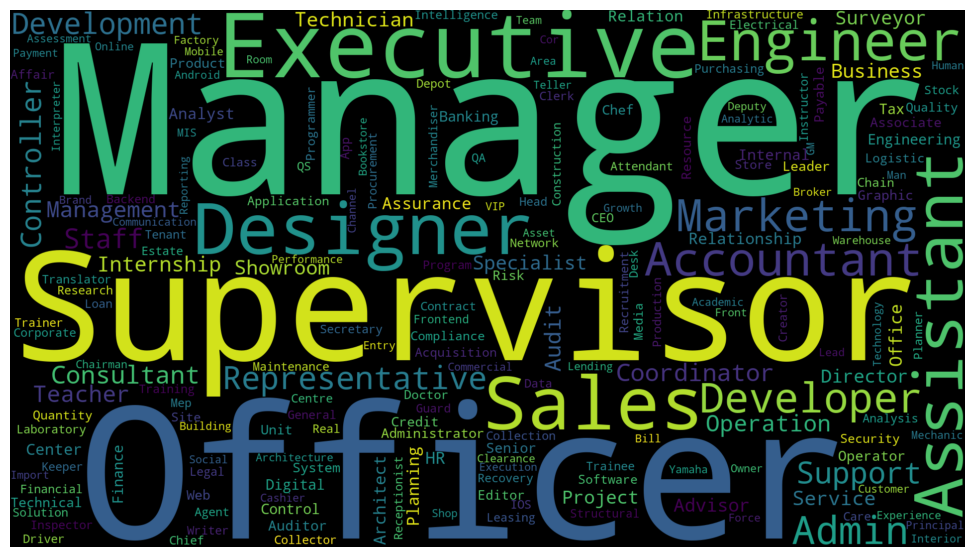

<Figure size 640x480 with 0 Axes>

In [9]:

# Creating the text variable
text = " ".join(cat.split()[1] if len(cat.split()) > 1 else "" for cat in clean_data.Job_position)

# Creating word_cloud with text as argument in .generate() method
word_cloud = WordCloud(width = 1920, height = 1080, collocations=False, background_color='black').generate(text)

# Display the generated Word Cloud
plt.figure(figsize=(10, 6))
plt.imshow(word_cloud, interpolation='bilinear')
plt.tight_layout(pad=0)
plt.axis("off")
plt.show()

plt.savefig('wordcloud.png', facecolor='k', bbox_inches='tight')

#### Top Position Bar Chart

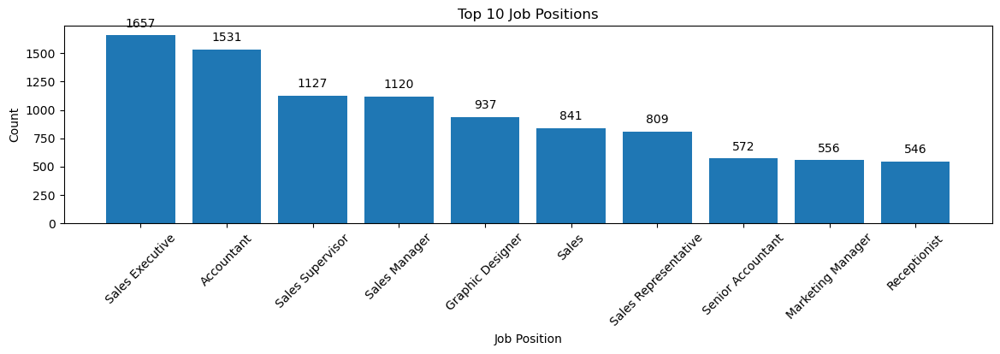

In [10]:
# Assuming you have a DataFrame called 'df' with a column named 'job_position'
top_10_jobs = clean_data['Job_position'].str.replace('/','').value_counts().head(10)

# Create a bar plot
fig, ax = plt.subplots(figsize=(14, 3))
ax.bar(top_10_jobs.index, top_10_jobs.values)
plt.xlabel('Job Position')
plt.ylabel('Count')
plt.title('Top 10 Job Positions')
plt.xticks(rotation=45)

# Display the count on top of each bar
for i, v in enumerate(top_10_jobs):
    ax.text(i, v+50, str(v), ha='center', va='bottom')
plt.show()


In [11]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_jobs = clean_data['Job_position'].value_counts().head(10)
fig=px.bar(top_10_jobs,x=top_10_jobs.index,
           y=top_10_jobs.values,color=top_10_jobs.index,
           text=top_10_jobs.values,
           labels={'index':'job title','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Popular Job Position')
fig.show()

#### Top Industry

In [12]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_industry = clean_data['Industry'].value_counts().head(10)
fig=px.bar(top_10_industry,x=top_10_industry.index,
           y=top_10_industry.values,color=top_10_industry.index,
           text=top_10_industry.values,
           labels={'index':'Industry','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Popular Industry')
fig.show()

#### Top Job_Categories 

In [13]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_job_Categories = clean_data['Job_Categories'].value_counts().head(10)
fig=px.bar(top_10_job_Categories,x=top_10_job_Categories.index,
           y=top_10_job_Categories.values,color=top_10_job_Categories.index,
           text=top_10_job_Categories.values,
           labels={'index':'Job_Categories','y':'count','text':'count'},
           template='seaborn',title='<b> Top 10 Popular Job_Categories')
fig.show()

#### Position Slash and without slash

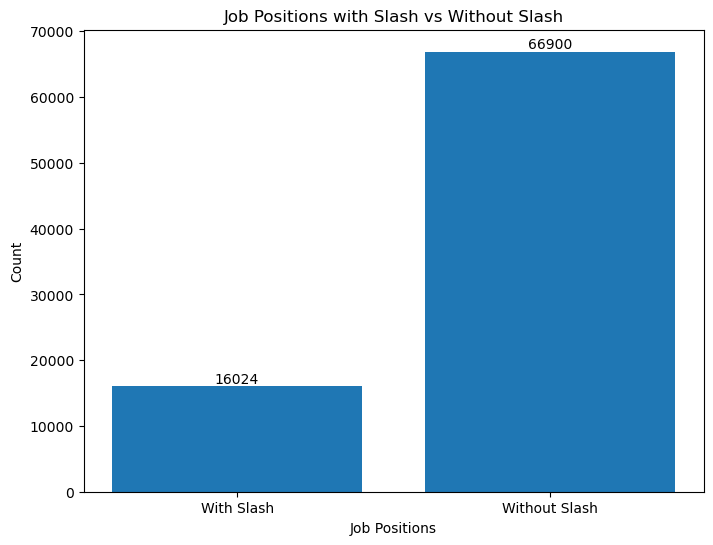

In [14]:


# Assuming you have a DataFrame called 'clean_data' with a column named 'Position'
with_slash = clean_data['Job_position'].str.contains('/').sum()
without_slash = len(clean_data) - with_slash

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(['With Slash', 'Without Slash'], [with_slash, without_slash])
plt.xlabel('Job Positions')
plt.ylabel('Count')
plt.title('Job Positions with Slash vs Without Slash')

# Display the count on top of each bar
for i, v in enumerate([with_slash, without_slash]):
    plt.text(i, v + 50, str(v), ha='center', va='bottom')

plt.show()

In [15]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Position'
job_positions_with_slash = clean_data[clean_data['Job_position'].str.contains('/')]['Job_position'].value_counts()
job_positions_with_slash = pd.DataFrame(job_positions_with_slash)
job_positions_with_slash.shape

(5626, 1)

In [16]:
job_positions_with_slash.head(10).style.background_gradient(cmap='jet')

,count
Job_position,
Marketing Manager / Sales,171
Marketing / Sales,115
Admin / HR,110
UX/UI Designer,101
Distribution / Executive / Sales,94
Admin Manager / HR,93
Admin Officer / HR,92
Admin / Accountant,90
Marketing Executive / Sales,87


In [17]:
clean_data['Industry'].value_counts()

Industry
General Business Services                        11798
Banking & Finance                                 9612
Architecture/Building/Construction                6575
Automotive  Vehicle                               6075
Real Estate                                       5752
Food & Beverages                                  5294
Education                                         4608
Recruiting Services                               4203
Manufacturing                                     2501
Trading                                           2313
Human Resource                                    2288
Property Development/Management                   2088
Information Technology                            1939
Wholesale/Retail                                  1929
Logistics/Freight/Shipping/Delivery/Warehouse     1741
Hotel/Hospitality                                 1615
Others                                            1515
Electronics/Electrical/Mechanical Equipment       1407
T

### Female in Top 10 of Categories

In [18]:
# Filter data for Female gender

filtered_gender = clean_data[clean_data['Gender'] == 'Female']

# Group by Job_Categories and count occurrences
job_categories_counts = filtered_gender['Job_Categories'].value_counts().head(10)

# Group by Job_position and count occurrences
job_position_counts = filtered_gender['Job_position'].value_counts().head(10)

# Group by Industry and count occurrences
industry_counts = filtered_gender['Industry'].value_counts().head(10)

# Create subplots with 1 row and 3 columns
fig = sp.make_subplots(rows=1, cols=3, subplot_titles=('Job Categories', 'Job Positions', 'Industries'))

# Add bar trace for Job Categories
fig.add_trace(go.Bar(x=job_categories_counts.index, y=job_categories_counts.values),
              row=1, col=1)

# Add bar trace for Job Positions
fig.add_trace(go.Bar(x=job_position_counts.index, y=job_position_counts.values),
              row=1, col=2)

# Add bar trace for Industries
fig.add_trace(go.Bar(x=industry_counts.index, y=industry_counts.values),
              row=1, col=3)

# Update layout
fig.update_layout(showlegend=False, height=400, title_text='<b> Female in Top 10 of Categories')

# Display the graph
fig.show()

## Company Name analysis

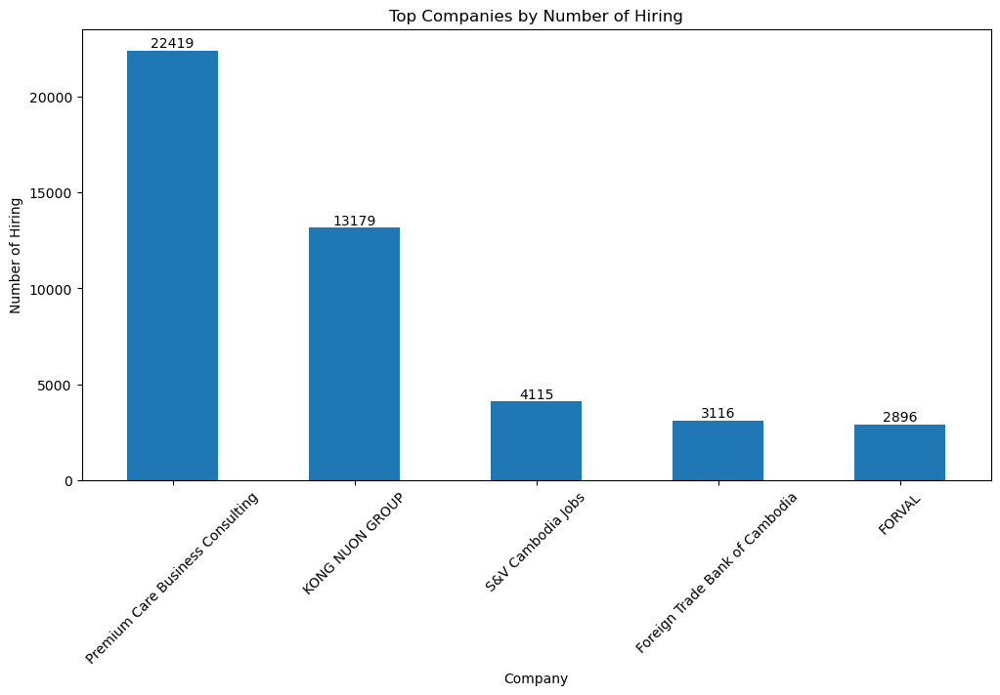

In [19]:

# Assuming you have a DataFrame called 'data_after_drop_column'
# Group the data by company name and calculate the sum of hiring
company_hiring = clean_data.groupby('Company_Name')['Hiring'].sum()

# Sort the group by hiring values in descending order
sorted_company_hiring = company_hiring.sort_values(ascending=False)

# Select the top N companies (e.g., top 10)
top_n = 5
top_companies = sorted_company_hiring.head(top_n)

# Plot the bar chart
plt.figure(figsize=(12, 6))
top_companies.plot(kind='bar')
plt.xlabel('Company')
plt.ylabel('Number of Hiring')
plt.title('Top Companies by Number of Hiring')
plt.xticks(rotation=45)

# Add text annotations on top of each bar
for i, value in enumerate(top_companies.values):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

In [20]:
company_hiring

Company_Name
& Easy                               1
100s Rental Pty                      1
103 ENGINEERING AND CONSTRUCTION    54
103 ENTERPRISE RESOURCE PLANNING     6
103 New Production Group             1
                                    ..
蜀渝火锅餐厅                               7
顶尖科技                                63
香港地產                                43
黄金海岸水疗会所​                            6
龙视传媒 Long TV                         1
Name: Hiring, Length: 2861, dtype: int64

## Salary Analysis

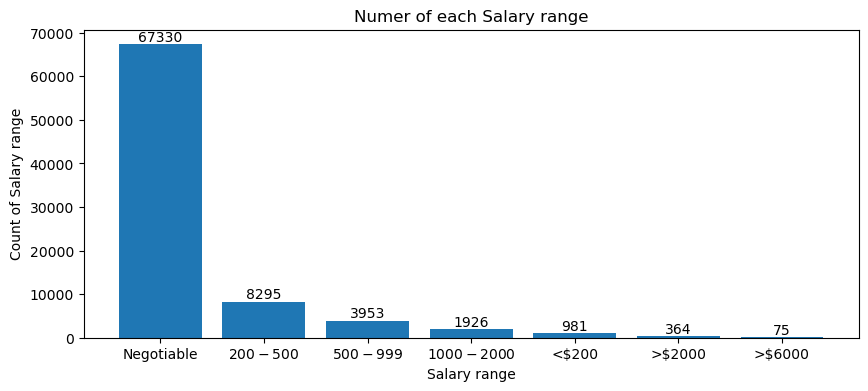

In [21]:
#bar Plot to show about Salary about unique_values and value_counts
# Figure Size
fig = plt.figure(figsize=(10, 4))

# Get value counts and unique values
value_counts = clean_data['Salary'].value_counts()

# Horizontal Bar Plot
plt.bar(value_counts.index, value_counts.values)
plt.xlabel('Salary range')
plt.ylabel('Count of Salary range')
plt.title('Numer of each Salary range')

# Add text annotations on top of each bar
for i, value in enumerate(value_counts.values):
    plt.text(i, value, str(value), ha='center', va='bottom')

# Show Plot
plt.show()


In [22]:

# Creating the histogram
fig = px.histogram(clean_data,x='Salary',marginal='rug',template='seaborn' ,labels={'Salary':'Salary'},title='<b> Salary Distribution', width=800, height=400)
# Display the plot
fig.show()

# Save the graph in high resolution
plt.savefig("seaborn_graph.png", dpi=720)

<Figure size 640x480 with 0 Axes>

### Type of Salary (Percentage) within Top 10 Industry

In [23]:
# Calculate count by language within each job category
count_clean_data_two_column = clean_data.groupby(['Salary', 'Industry']).size().reset_index(name='Count')

# Calculate percentage by language within each job category
count_clean_data_two_column['Percentage'] = count_clean_data_two_column.groupby('Salary')['Count'].transform(lambda x: (x / x.sum()) * 100)

# Filter top 10 job categories by count
top_10_categories = count_clean_data_two_column.groupby('Industry')['Count'].sum().nlargest(10).index
count_df = count_clean_data_two_column[count_clean_data_two_column['Industry'].isin(top_10_categories)]

# Reset index
count_df = count_df.reset_index(drop=True)

# Plot horizontal bar chart
fig = px.bar(count_df, y='Industry', x='Percentage', color='Salary',
             labels={'Percentage': 'Percentage (%)', 'Salary': 'Salary'},
             title='Type of Salary (Percentage) within Top 10 Industry',
             orientation='h')

fig.show()

### Type of Salary (Percentage) within Top 10 Job Categories

In [24]:

# Calculate count by language within each job category
count_clean_data_two_column = clean_data.groupby(['Salary', 'Job_Categories']).size().reset_index(name='Count')

# Calculate percentage by language within each job category
count_clean_data_two_column['Percentage'] = count_clean_data_two_column.groupby('Salary')['Count'].transform(lambda x: (x / x.sum()) * 100)

# Filter top 10 job categories by count
top_10_categories = count_clean_data_two_column.groupby('Job_Categories')['Count'].sum().nlargest(10).index
count_df = count_clean_data_two_column[count_clean_data_two_column['Job_Categories'].isin(top_10_categories)]

# Reset index
count_df = count_df.reset_index(drop=True)

# Plot horizontal bar chart
fig = px.bar(count_df, y='Job_Categories', x='Percentage', color='Salary',
             labels={'Percentage': 'Percentage (%)', 'Salary': 'Salary'},
             title='Type of Salary (Percentage) within Top 10 Job Categories',
             orientation='h')

fig.show()

## Year of Experience Requirements analysis

In [25]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
top_10_years = clean_data['Experience_Year'].value_counts().head(5)
fig=px.bar(top_10_years,x=top_10_years.index,
           y=top_10_years.values,color=top_10_years.index,
       text=top_10_years.values,
           labels={'index':'Experience_Year','y':'count','text':'count'},
           template='seaborn',title='<b> The Most Year of Experience Requirements ')
fig.show()

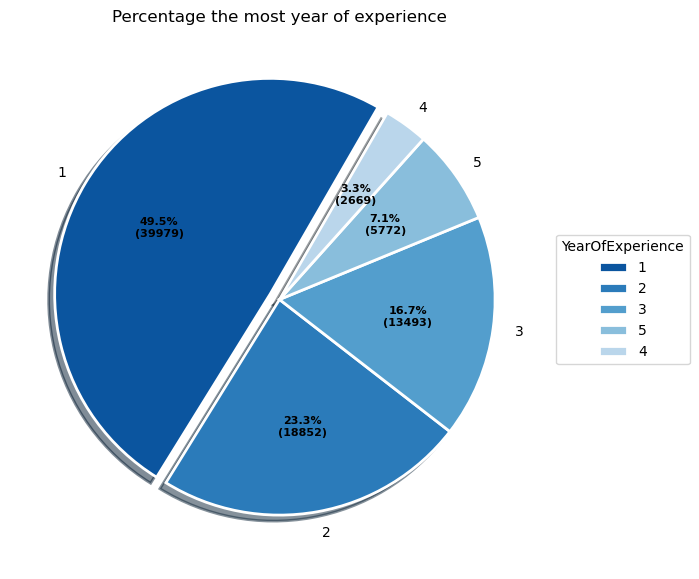

In [26]:
# Assuming you have a DataFrame named 'clean_data' containing the salary data

# Get the top 10 values and their counts
top_10_cars = clean_data['Experience_Year'].value_counts().head(5)

# Creating dataset
cars = top_10_cars.index
data = top_10_cars.values

# Creating explode data
explode = np.zeros(len(cars))
explode[0] = 0.05  # Explode the first slice

# Creating color parameters
colors = 'Blues_r'

# Wedge properties
wp = {'linewidth': 2, 'edgecolor': "white"}

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(data,
                                  autopct=lambda pct: func(pct, data),
                                  explode=explode,
                                  labels=cars,
                                  shadow=True,
                                  colors=sns.color_palette(colors),
                                  startangle=60,
                                  wedgeprops=wp,
                                  textprops=dict(color="black"))

# Adding legend
ax.legend(wedges, cars, title="YearOfExperience", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=8, weight="bold")
ax.set_title("Percentage the most year of experience")

# Show plot
plt.show()

In [27]:

# Assuming you have a DataFrame called 'clean_data' with columns 'Experience_level' and 'Experience_Year'
top_Experience_Year_basedOn_Experience_level = clean_data.groupby([ 'Experience_level','Experience_Year']).size().reset_index(name='count')
top_Experience_Year_basedOn_Experience_level = top_Experience_Year_basedOn_Experience_level.sort_values('count', ascending=False).head(10)

fig = px.bar(top_Experience_Year_basedOn_Experience_level, x='Experience_level', y='Experience_Year',
             color='Experience_Year', text='count',
             labels={'Experience_Year': 'Experience Year', 'count': 'Count'},
             template='seaborn', title='<b> The Most Years of Experience Requirements')

fig.show()

In [28]:
# Given grouped data
grouped_data = clean_data.groupby('Experience_Year')['Experience_level'].value_counts()

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Filter for the top 10 most numerous categories
experience_year = df.groupby('Experience_Year')['Count'].sum().nlargest(10).index

# Filter the DataFrame for the top 10 industries
experience_level = df[df['Experience_Year'].isin(experience_year)]

# Define a color palette
color_palette = px.colors.qualitative.Plotly                                     

# Plotly Express bar chart with color palette
fig = px.bar(experience_level, x='Experience_level', y='Count', color='Experience_Year',
             labels={'Experience_Year': 'Experience Level', 'Count': 'Count'},
             title='The Most Years of Experience Requirements',
             hover_data={'Count': True, 'Experience_level': False},
             barmode='group',
             color_discrete_sequence=color_palette)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

In [29]:
# Create a treemap visualization using Plotly Express
fig = px.treemap(clean_data,
                 path=[px.Constant('Industry'), 'Industry', 'Experience_level'],
                 template='ggplot2',
                 hover_name='Industry',
                 title='<b>TreeMap of Different Job Types in Location with Experience Level')

# Update the color of the root node to 'lightgrey'
fig.update_traces(root_color='lightgrey')

# Display the treemap visualization
fig.show()

In [30]:

top_Experience_Year_basedOn_Experience_level1 = clean_data[['Experience_level', 'Experience_Year','Job_position','Qualification']]
q = top_Experience_Year_basedOn_Experience_level1[top_Experience_Year_basedOn_Experience_level1['Job_position']== 'Cleaner']
q_styled = q.head(10).style.background_gradient(cmap='jet')

q_styled

,Experience_level,Experience_Year,Job_position,Qualification
344,Entry,1,Cleaner,Unlimited
1870,Fresh Graduate,1,Cleaner,High School Diploma
2496,Entry,1,Cleaner,High School Diploma
2930,Entry,1,Cleaner,Unlimited
3774,Entry,1,Cleaner,Unlimited
5458,Entry,1,Cleaner,Unlimited
5472,Entry,1,Cleaner,Unlimited
13002,Middle,1,Cleaner,Unlimited
14319,Entry,1,Cleaner,Unlimited
14490,Entry,1,Cleaner,Unlimited


In [31]:

top_Experience_Year_basedOn_Experience_level1 = clean_data[['Experience_level', 'Experience_Year','Job_position']]
q = top_Experience_Year_basedOn_Experience_level1[top_Experience_Year_basedOn_Experience_level1['Experience_level']== 'Fresh Graduate']
q_styled = q.head(10).style.background_gradient(cmap='jet')

q_styled

,Experience_level,Experience_Year,Job_position
27,Fresh Graduate,1,Infrastructure / ASK Internship
35,Fresh Graduate,1,Inventory / Internship
73,Fresh Graduate,2,Accountant
74,Fresh Graduate,2,Fitness Attendant
77,Fresh Graduate,2,Communication Coordinator / Marketing
78,Fresh Graduate,1,Room Attendant
79,Fresh Graduate,5,Property Manager
82,Fresh Graduate,2,Assistant MD
83,Fresh Graduate,3,Project Drafter
85,Fresh Graduate,1,Front Desk Officer


In [32]:
top_Experience_Year_basedOn_Experience_level1 = clean_data[['Experience_level', 'Experience_Year','Job_position']]
q = top_Experience_Year_basedOn_Experience_level1[(top_Experience_Year_basedOn_Experience_level1['Job_position']== 'Cleaner') &( top_Experience_Year_basedOn_Experience_level1['Experience_level']== 'Others')]
q_styled = q.head(100).style.background_gradient(cmap='jet')

q_styled

,Experience_level,Experience_Year,Job_position
64033,Others,1,Cleaner


In [33]:

# q2 =top_Experience_Year_basedOn_Experience_level1
# q2.style.background_gradient(cmap='jet')



## Experience Level analysis

In [34]:
clean_data['Experience_level'].unique()

array(['Entry', 'Senior', 'Middle', 'Others', 'Top', 'Fresh Graduate'],
      dtype=object)

### Distribution of Experience Level

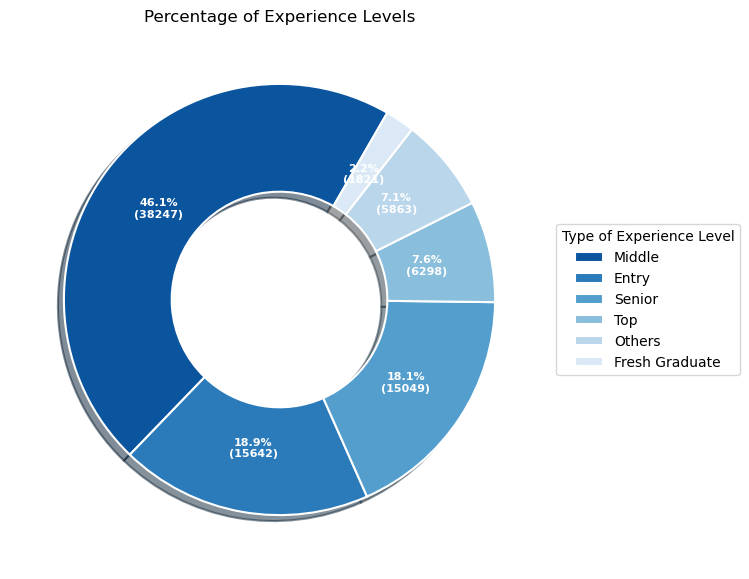

In [35]:
# Assuming you have a DataFrame named 'clean_data' containing the salary data

# Get the top 10 values and their counts
experience_level = clean_data['Experience_level'].value_counts()

# Creating dataset
experience_level_for_plot = experience_level.index

experience_level_for_count = experience_level.values

# Creating explode data
explode = np.zeros(len(experience_level_for_plot))
explode[0] = 0.0  # Explode the first slice

# Creating color parameters
colors = 'Blues_r'

# Wedge properties
wp = {'linewidth': 1.5, 'edgecolor': "white", 'width': 0.5}

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(experience_level_for_count,
                                  autopct=lambda pct: func(pct, experience_level_for_count),
                                  explode=explode,
                                  labels=experience_level_for_plot,
                                  shadow=True,
                                  colors=sns.color_palette(colors),
                                  startangle=60,
                                  pctdistance=0.70,
                                  wedgeprops=wp,
                                  textprops=dict(color="white"))

# Draw a white circle at the center to create the donut shape
center_circle = plt.Circle((5, 5), 0.70, fc='white')
fig.gca().add_artist(center_circle)

# Adding legend
ax.legend(wedges, experience_level_for_plot, title="Type of Experience Level", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.setp(autotexts, size=8, weight="bold")
ax.set_title("Percentage of Experience Levels")

# Show plot
plt.show()

### Distribution of Experience Level Across Industry

In [36]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Experience_level'].value_counts()

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Filter for the top 10 most numerous categories
top_industries = df.groupby('Industry')['Count'].sum().nlargest(10).index

# Filter the DataFrame for the top 10 industries
top_categories = df[df['Industry'].isin(top_industries)]

# Define a color palette
color_palette = px.colors.qualitative.Plotly                                     

# Plotly Express bar chart with color palette
fig = px.bar(top_categories, x='Industry', y='Count', color='Experience_level',
             labels={'Experience_level': 'Experience Level', 'Count': 'Count'},
             title='Experience Level Counts by Industry (Top 10 Most Numerous)',
             hover_data={'Count': True, 'Experience_level': False},
             barmode='group',
             color_discrete_sequence=color_palette)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

## Job Type analysis

### Number of Job type

In [37]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
jobs_type = clean_data['Job_Type'].value_counts()
fig=px.bar(jobs_type,x=jobs_type.index,
           y=jobs_type.values,color=jobs_type.index,
           text=jobs_type.values,
           labels={'index':'Job Type','y':'count Job Type','text':'count'},
           template='seaborn',title='<b> Number of the Job Type')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)
fig.show()

### TreeMap of Different Job type in Location with Experience Level

In [38]:
fig=px.treemap(clean_data,
               path=[px.Constant('Job_position'),
                     'Job_Categories','Location',
                     'Experience_level'],
                     template='ggplot2',
                     hover_name='Job_Categories',
                     title='<b>TreeMap of Different Job type in Location with Experience Level')
fig.update_traces(root_color='lightgrey')

## Location analysis

### Top 10 Location with highest hiring Job Position

In [39]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
locations = clean_data['Location'].value_counts()


fig=px.bar(locations,x=locations.index,
           y=locations.values,color=locations.index,
           text=locations.values,
           labels={'index':'Location','y':'count','text':'count'},
           template='seaborn',title='<b> Distibution of location that is numberous of Job Posting')
fig.show()

### Distribution Location with numerous industries

#### Creating New table

In [40]:
# Assuming your old table is named 'old_table'
# Specify the columns you want to include in the new table
columns_to_get = ['Location', 'Industry']

# Create a new table by copying the old table and selecting the desired columns
new_table = clean_data.copy()[columns_to_get]

# Print the new table
print(new_table)

         Location                            Industry
0      Phnom Penh           General Business Services
1      Phnom Penh                    Wholesale/Retail
2      Phnom Penh                    Wholesale/Retail
3      Phnom Penh           General Business Services
4      Phnom Penh                    Wholesale/Retail
...           ...                                 ...
82919  Phnom Penh           General Business Services
82920  Phnom Penh           General Business Services
82921  Phnom Penh           General Business Services
82922  Phnom Penh  Architecture/Building/Construction
82923      Kandal           General Business Services

[82924 rows x 2 columns]


In [41]:
#replace name location to make sure it spell correctly 
new_table['Location']= new_table['Location'].str.strip()
new_table['Location']= new_table['Location'].str.replace('Oddor Meanchey','Oddar Meanchey')
new_table['Location']= new_table['Location'].str.replace('Tboung Khmum','Tbong Khmum')
new_table['Location']= new_table['Location'].str.replace('Sre Ambel','Srae Ambel')
new_table['Location']= new_table['Location'].str.replace('Rattanakiri','Ratanakiri')

#### Calculate longitude and latitude with creating new columns

In [42]:
# Assuming your data is in a pandas DataFrame named 'clean_data'
# Group data by location and sort by count of industries
grouped_data = (
    new_table.groupby("Location")["Industry"]
    .count()
    .to_frame(name="Industry_Count")
    .sort_values(by="Industry_Count", ascending=False)
    .reset_index()
)

# Select top 'n' locations
count_locations = grouped_data  # Replace 'n' with the desired number of locations

# Create a geocoder
geolocator = Nominatim(user_agent="my_geocoder")

# Create lists to store latitude and longitude values
latitude_data = []
longitude_data = []

# Geocode each location
for location in count_locations["Location"]:
    location_info = geolocator.geocode(location)
    if location_info is not None:
        latitude = location_info.latitude
        longitude = location_info.longitude
        latitude_data.append(latitude)
        longitude_data.append(longitude)
    else:
        latitude_data.append(None)
        longitude_data.append(None)

# Add latitude and longitude columns to the top locations DataFrame
count_locations["Latitude"] = latitude_data
count_locations["Longitude"] = longitude_data

# Print the updated DataFrame
print(count_locations)

            Location  Industry_Count   Latitude   Longitude
0         Phnom Penh           69825  11.568271  104.922443
1     Preah Sihanouk            2337  10.732199  103.759581
2          Siem Reap            1360  13.361756  103.859032
3       Kampong Speu             959  11.577537  104.271402
4             Kandal             948  11.396262  105.020787
5             Kampot             868  10.631475  104.132637
6       Kampong Cham             784  12.117486  105.208002
7         Battambang             688  12.925679  103.231714
8              Takeo             575  10.935392  104.789883
9   Banteay Meanchey             508  13.798915  102.886267
10         Provinces             423  47.599053    1.336296
11      Kampong Thom             395  12.668792  104.887920
12   Kampong Chhnang             389  12.138203  104.335410
13        Svay Rieng             311  11.194228  105.797328
14            Pursat             285  12.466259  103.742683
15          Koh Kong             283  11

#### Visualization Map

In [43]:
# Assuming you have latitude, longitude, and size information in your 'count_locations' DataFrame
latitude_data = count_locations["Latitude"]
longitude_data = count_locations["Longitude"]
size_data = count_locations["Industry_Count"]  # Replace "Industry Count" with your actual column name
color_data = count_locations["Location"]  # Replace "Location" with your actual column name

# Create a scatter map using plotly.express
fig = px.scatter_mapbox(count_locations, lat=latitude_data, lon=longitude_data,
                        hover_name="Location", hover_data=["Industry_Count"],
                        size=size_data, color=color_data, zoom=10, color_continuous_scale='Viridis')

# Customize the map layout
fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    legend={'title': 'Legend Label'},
      legend_title_font_size=12
)

# Show the map
fig.show()

## Distribution of Experience Level Across Job Types

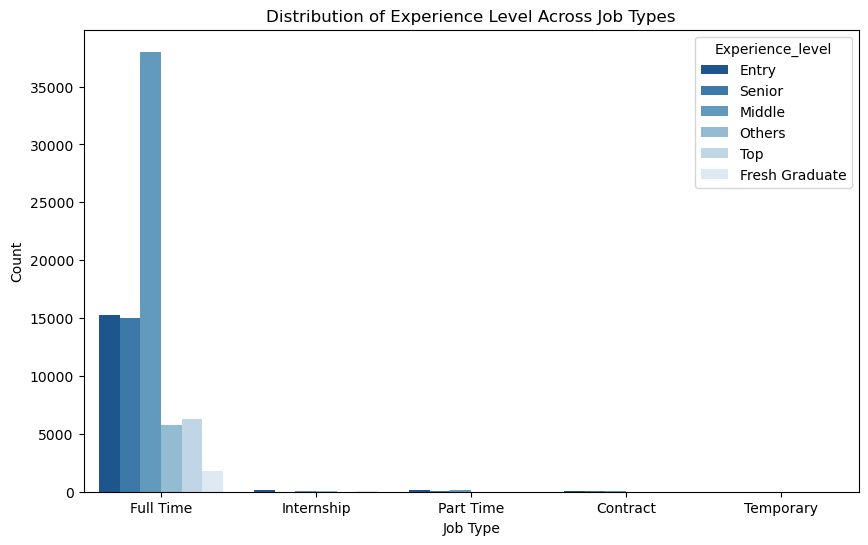

In [44]:
plt.figure(figsize=(10, 6))  
sns.countplot(data=clean_data, x='Job_Type', hue='Experience_level', palette='Blues_r')

plt.title('Distribution of Experience Level Across Job Types')
plt.xlabel('Job Type')
plt.ylabel('Count')

plt.show()

## Gender diversity analysis

In [45]:

# Calculate the count and percentage of each job type
gender_counts = clean_data['Gender'].value_counts().head(10)
total_gender = gender_counts.sum()
gender_percentages = gender_counts / total_gender * 100

# Create a DataFrame with the job type counts and percentages
job_type_data = pd.DataFrame({'Gender': gender_percentages.index, 'Percentage': gender_percentages.values})

# Plot the pie chart with job type percentages
fig = px.pie(job_type_data, names='Gender', values='Percentage', color='Gender',
             hole=0.5, labels={'Gender': 'Gender', 'Percentage': 'Percentage'},
             template='seaborn', title='<b>Total Gender')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)

# Show the plot
fig.show()

#### Distribution of Gender Across Job Types

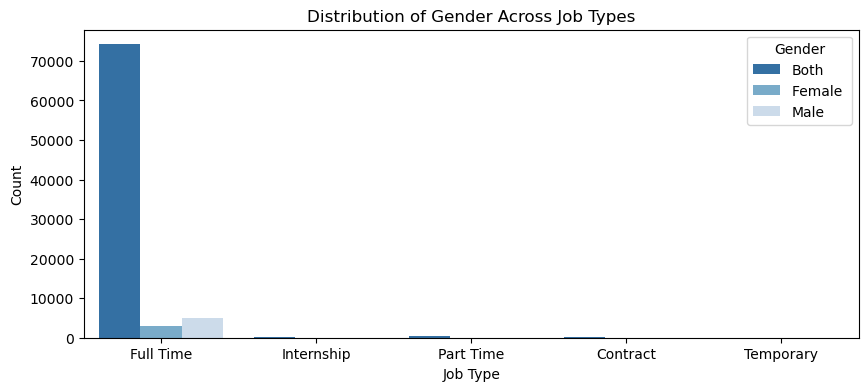

In [46]:
plt.figure(figsize=(10, 4))  
sns.countplot(data=clean_data, x='Job_Type', hue='Gender', palette='Blues_r')

plt.title('Distribution of Gender Across Job Types')
plt.xlabel('Job Type')
plt.ylabel('Count')

plt.show()

#### Distribution of Gender Across Industry

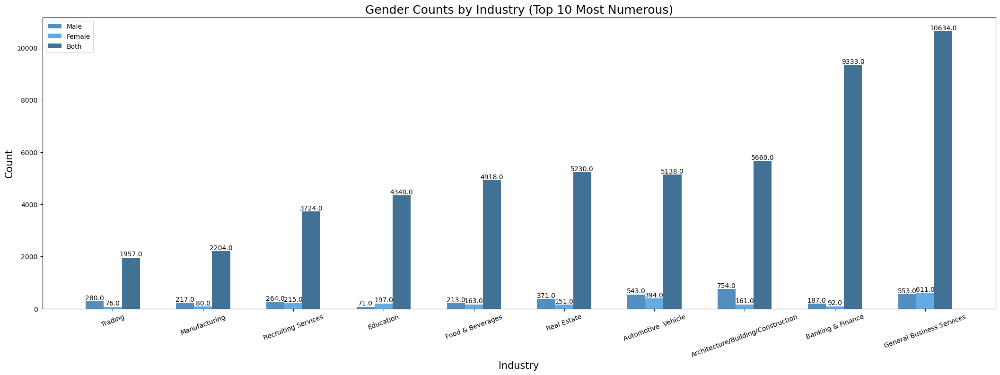

In [47]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Gender'].value_counts()

# Get unique industry names
industry_list = grouped_data.index.get_level_values('Industry').unique()

# Initialize empty lists for gender counts
male_counts = np.zeros(len(industry_list))
female_counts = np.zeros(len(industry_list))
both_counts = np.zeros(len(industry_list))

# Iterate over the grouped data and extract gender counts
for (industry, gender), count in grouped_data.items():
    index = np.where(industry_list == industry)[0][0]
    
    if gender == 'Male':
        male_counts[index] = count
    elif gender == 'Female ':
        female_counts[index] = count
    elif gender == 'Both':
        both_counts[index] = count

# Find the indices of the three most numerous categories
most_numerous_indices = np.argsort(both_counts + male_counts + female_counts)[-10:]

plt.figure(figsize=(26, 8))

classes_index = np.arange(len(most_numerous_indices))
width = 0.2

bar1 = plt.bar(classes_index - width, male_counts[most_numerous_indices], width, color='#548EBE', label="Male")
bar2 = plt.bar(classes_index, female_counts[most_numerous_indices], width, color='#64AAE3', label="Female")
bar3 = plt.bar(classes_index + width, both_counts[most_numerous_indices], width, color='#427196', label="Both")

plt.xticks(classes_index, industry_list[most_numerous_indices], rotation=20)
plt.title("Gender Counts by Industry (Top 10 Most Numerous)", fontsize=18)
plt.xlabel("Industry", fontsize=15)
plt.ylabel("Count", fontsize=15)
plt.legend()

# Display number/count values on top of each bar
for rect in bar1 + bar2 + bar3:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width() / 2, height, height,
             ha='center', va='bottom', fontsize=10)

plt.show()

In [48]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Gender'].value_counts()

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Filter for the top 10 most numerous categories
top_categories = df.groupby('Industry').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

# Define a color palette
color_palette = px.colors.qualitative.Plotly                                     

# Plotly Express bar chart with color palette
fig = px.bar(top_categories, x='Industry', y='Count', color='Gender',
             labels={'Gender': 'Gender', 'Count': 'Count'},
             title='Gender Counts by Industry',
             hover_data={'Count': True, 'Gender': False},
             barmode='group',
             color_discrete_sequence=color_palette)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

### Gender Counts by Top 10 Industries

In [49]:
# Given grouped data
grouped_data = clean_data.groupby('Industry')['Gender'].value_counts()

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Calculate the total count for each industry
industry_counts = df.groupby('Industry')['Count'].sum().reset_index()

# Filter for the top 10 most numerous industries
top_industries = industry_counts.nlargest(10, 'Count')['Industry']

# Filter the DataFrame to include only the top 10 industries
filtered_df = df[df['Industry'].isin(top_industries)]

# Define a color palette
color_palette = px.colors.qualitative.Plotly                                     

# Plotly Express bar chart with color palette
fig = px.bar(filtered_df, x='Industry', y='Count', color='Gender',
             labels={'Gender': 'Gender', 'Count': 'Count'},
             title='Gender Counts by Top 10 Industries',
             hover_data={'Count': True, 'Gender': False},
             barmode='group',
             color_discrete_sequence=color_palette)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

## Age Analysis

In [50]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
age_type = clean_data['Age'].value_counts().head(10)

total_age = age_type.sum()

# Calculate the percentage of each language
age_percentages = (age_type / total_age) * 100
age_percentages =age_percentages.round(3)

fig=px.bar(age_type,x=age_percentages.index,
           y=age_percentages.values,color=age_percentages.index,
           text=age_percentages.values,
           labels={'index':'Age','y':'Age Percent','Percentage':'Percentage'},
           template='seaborn',title='<b> Percentage of the most Age requirement')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=400,  # Set the height of the pie chart
    width=800,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)
fig.show()

#### Age outlier

In [51]:
# Convert data to a pandas DataFrame
age_outlier = pd.DataFrame(clean_data['Age'])

# Create a box plot using Plotly Express
fig = px.box(age_outlier,template='seaborn',title='<b> Distribution of Age Across Industry',labels={'y':'Age Count'},)

# Customize the plot
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)

# Show the plot
fig.show()

#### Distribution of Age Across Industry

In [52]:
# Convert 'Age' column to numeric data type
clean_data['Age'] = pd.to_numeric(clean_data['Age'], errors='coerce')

# Group the data by 'Industry' and create a box plot for each group
fig = px.box(clean_data, x='Industry', y='Age', template='seaborn', title='<b> Distribution of Age Across Industry',
             labels={'x': 'Industry', 'y': 'Age Count'})

# Customize the plot
fig.update_traces(marker_color='rgb(158, 202, 225)', marker_line_color='rgb(8, 48, 107)',
                  marker_line_width=1.5, opacity=0.9)

# Show the plot
fig.show()

## Qualification Analysis

In [53]:
clean_data['Qualification'].unique()

array(['High School Diploma', "Bachelor's Degree", "Master's Degree",
       'Unlimited', "Associate's Degree", 'Professional Degree',
       'Doctoral Degree'], dtype=object)

In [54]:
# Calculate the count and percentage of each Qualification
qualification_counts = clean_data['Qualification'].value_counts().head(10)
total_qualification = qualification_counts.sum()
qualification_percentages = qualification_counts / total_qualification * 100

# Create a DataFrame with the Qualification counts and percentages
job_type_data = pd.DataFrame({'Qualification': qualification_percentages.index, 'Percentage': qualification_percentages.values})

# Plot the pie chart with job type percentages
fig = px.pie(job_type_data, names='Qualification', values='Percentage', color='Qualification',
             hole=0.5, labels={'Qualification': 'Qualification', 'Percentage': 'Percentage'},
             template='seaborn', title='<b>Percentage of Qualification Type')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)

# Show the plot
fig.show()

## Language Requirements Analysis

In [55]:
# Assuming you have a DataFrame called 'clean_data' with a column named 'Job_position' and plot top 10 
language_type = clean_data['Language'].value_counts()

total_count = language_type.sum()

# Calculate the percentage of each language
language_percentages = (language_type / total_count) * 100
language_percentages =language_percentages.round(3)

fig=px.bar(language_type,x=language_percentages.index,
           y=language_percentages.values,color=language_type.index,
           text=language_percentages.values,
           labels={'index':'Language','y':'Language Percent','Percentage':'Percentage'},
           template='seaborn',title='<b> Percentage of the Language Type')

# Modify the layout to change the size of the pie chart and overall figure
fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)
fig.show()

In [56]:
language_type = clean_data['Language'].value_counts()
total_count = language_type.sum()

# Filter for the top five most common languages
top_languages = language_type.nlargest(5)

fig = px.pie(values=top_languages.values,
             names=top_languages.index,
             template='seaborn',
             title='<b>Percentage of the Language Type')

fig.update_traces(textinfo='percent+label')

fig.update_layout(
    height=500,  # Set the height of the pie chart
    width=700,   # Set the width of the pie chart
    autosize=False  # Disable autosizing of the figure
)

fig.show()

### Language Percentage within Top 10 Job Categories

In [57]:
# Calculate count by language within each job category
count_clean_data_two_column = clean_data.groupby(['Language', 'Job_Categories']).size().reset_index(name='Count')

# Calculate percentage by language within each job category
count_clean_data_two_column['Percentage'] = count_clean_data_two_column.groupby('Job_Categories')['Count'].transform(lambda x: (x / x.sum()) * 100)

# Filter top 10 job categories by count
top_10_categories = count_clean_data_two_column.groupby('Job_Categories')['Count'].sum().nlargest(10).index
count_df = count_clean_data_two_column[count_clean_data_two_column['Job_Categories'].isin(top_10_categories)]

# Reset index
count_df = count_df.reset_index(drop=True)

# Plot horizontal bar chart
fig = px.bar(count_df, y='Job_Categories', x='Percentage', color='Language',
             labels={'Percentage': 'Percentage (%)', 'Language': 'Language'},
             title='Language Percentage within Top 10 Job Categories',
             orientation='h')

fig.show()

## Hiring Analaysis

### Numberouse of hiring by year

In [58]:

# Example publish date
publish_date = clean_data['Publish_Date']  # Accessing the 'Publish_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2020  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year > year].copy()

# Extract the month and year from the 'Publish_Date' column
filtered_data.loc[:, 'Year'] = filtered_data['Publish_Date'].dt.year

# Given grouped data
grouped_data = filtered_data.groupby('Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Year'] = pd.to_datetime(df['Year'], format='%Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Year'].dt.strftime('%Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of publish date by Year {year}",
    xaxis={'title': 'Publish Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Hiring Counts by Industry (Top 10 Most Numerous) - Year Publish Date Job application

In [59]:
# Example publish date
publish_date = clean_data['Publish_Date']  # Accessing the 'Publish_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the month and year from the datetime object
month_year = date_obj.dt.strftime('%b %Y')

# Given grouped data
grouped_data = clean_data.groupby(month_year)['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Define a color palette
color_palette = px.colors.qualitative.Plotly

# List of desired years
years = [ 2021, 2022, 2023]  # Add the years you want to plot here

# Create subplots for each year
fig = make_subplots(rows=2, cols=2, subplot_titles=[f"Year {year}" for year in years])

# Iterate over the years and create a bar chart for each
for i, year in enumerate(years):
    filtered_data = df[df['Publish_Date'].str.contains(str(year))]  # Filter the data for the current year

    # Filter for the top 10 most numerous categories
    top_categories = filtered_data.groupby('Publish_Date').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

    # Extract the month and year from the 'Publish_Date' column
    top_categories['Month_Year'] = top_categories['Publish_Date'].str.extract(r'(\w+\s\d{4})')

    # Convert 'Month_Year' column to datetime object
    top_categories['Month_Year'] = pd.to_datetime(top_categories['Month_Year'], format='%b %Y')

    # Order the data by month and count
    top_categories = top_categories.sort_values(['Month_Year', 'Count'], ascending=[True, False])

    # Create a bar chart for the current year
    fig.add_trace(
        go.Bar(
            x=top_categories['Month_Year'].dt.strftime('%b %Y'),
            y=top_categories['Count'],
            marker_color=color_palette,
            name=f"Year {year}",
        ),
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

    # Update the layout for the current subplot
    fig.update_layout(
        xaxis={'categoryorder': 'array', 'categoryarray': top_categories['Month_Year'].dt.strftime('%b %Y').unique()},
        title_text=f"Hiring Counts by Industry (Top 10 Most Numerous) - Year Publish Date Job application {year}",
        showlegend=True,
    )

# Update the height and width of the subplots
fig.update_layout(height=600, width=900)

# Show the figure
fig.show()

### Total Hiring of publish date in 2021

In [60]:

# Example publish date
publish_date = clean_data['Publish_Date']  # Accessing the 'Publish_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2021  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year == year].copy()

# Extract the month and year from the 'Publish_Date' column
filtered_data.loc[:, 'Month_Year'] = filtered_data['Publish_Date'].dt.strftime('%b %Y')

# Given grouped data
grouped_data = filtered_data.groupby('Month_Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Month_Year'] = pd.to_datetime(df['Month_Year'], format='%b %Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Month_Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Month_Year'].dt.strftime('%b %Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of publish date by Year {year}",
    xaxis={'title': 'Publish Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring of publish date in 2022

In [61]:

# Example publish date
publish_date = clean_data['Publish_Date']  # Accessing the 'Publish_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2022  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year == year].copy()

# Extract the month and year from the 'Publish_Date' column
filtered_data.loc[:, 'Month_Year'] = filtered_data['Publish_Date'].dt.strftime('%b %Y')

# Given grouped data
grouped_data = filtered_data.groupby('Month_Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Month_Year'] = pd.to_datetime(df['Month_Year'], format='%b %Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Month_Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Month_Year'].dt.strftime('%b %Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of publish date by Year {year}",
    xaxis={'title': 'Publish Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring of publish date in 2023

In [62]:

# Example publish date
publish_date = clean_data['Publish_Date']  # Accessing the 'Publish_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2023  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year == year].copy()

# Extract the month and year from the 'Publish_Date' column
filtered_data.loc[:, 'Month_Year'] = filtered_data['Publish_Date'].dt.strftime('%b %Y')

# Given grouped data
grouped_data = filtered_data.groupby('Month_Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Month_Year'] = pd.to_datetime(df['Month_Year'], format='%b %Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Month_Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Month_Year'].dt.strftime('%b %Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of publish date by Year {year}",
    xaxis={'title': 'Publish Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Hiring Counts by Industry (Top 10 Most Numerous) - Year Closing Date Job application

In [63]:
# Example publish date
closing_date = clean_data['Closing_Date']  # Accessing the 'Publish_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(closing_date, format='%Y-%m-%d')

# Extract the month and year from the datetime object
month_year = date_obj.dt.strftime('%b %Y')

# Given grouped data
grouped_data = clean_data.groupby(month_year)['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
new_data_frame = grouped_data.reset_index(name='Count')

# Define a color palette
color_palette = px.colors.qualitative.Plotly

# List of desired years
years = [ 2021, 2022, 2023]  # Add the years you want to plot here

# Create subplots for each year
fig = make_subplots(rows=2, cols=2, subplot_titles=[f"Year {year}" for year in years])

# Iterate over the years and create a bar chart for each
for i, year in enumerate(years):
    filtered_data = new_data_frame[new_data_frame['Closing_Date'].str.contains(str(year))]  # Filter the data for the current year

    # Filter for the top 10 most numerous categories
    top_categories = filtered_data.groupby('Closing_Date').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

    # Extract the month and year from the 'Publish_Date' column
    top_categories['Month_Year'] = top_categories['Closing_Date'].str.extract(r'(\w+\s\d{4})')

    # Convert 'Month_Year' column to datetime object
    top_categories['Month_Year'] = pd.to_datetime(top_categories['Month_Year'], format='%b %Y')

    # Order the data by month and count
    top_categories = top_categories.sort_values(['Month_Year', 'Count'], ascending=[True, False])

    # Create a bar chart for the current year
    fig.add_trace(
        go.Bar(
            x=top_categories['Month_Year'].dt.strftime('%b %Y'),
            y=top_categories['Count'],
            marker_color=color_palette,
            name=f"Year {year}",
        ),
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

    # Update the layout for the current subplot
    fig.update_layout(
        xaxis={'categoryorder': 'array', 'categoryarray': top_categories['Month_Year'].dt.strftime('%b %Y').unique()},
        title_text=f"Hiring Counts by Industry (Top 10 Most Numerous) - Year Closing Date Job application {year}",
        showlegend=True,
    )

# Update the height and width of the subplots
fig.update_layout(height=600, width=900)

# Show the figure
fig.show()

### Total Hiring of closing date in 2021

In [64]:

# Example Closing Date
publish_date = clean_data['Closing_Date']  # Accessing the 'Closing_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2021  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year == year].copy()

# Extract the month and year from the 'Closing_Date' column
filtered_data.loc[:, 'Month_Year'] = filtered_data['Publish_Date'].dt.strftime('%b %Y')

# Given grouped data
grouped_data = filtered_data.groupby('Month_Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Month_Year'] = pd.to_datetime(df['Month_Year'], format='%b %Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Month_Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Month_Year'].dt.strftime('%b %Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of closing date by Year {year}",
    xaxis={'title': 'Closing Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring of closing date in 2022

In [65]:

# Example Closing Date
publish_date = clean_data['Closing_Date']  # Accessing the 'Closing_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2022  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year == year].copy()

# Extract the month and year from the 'Closing_Date' column
filtered_data.loc[:, 'Month_Year'] = filtered_data['Publish_Date'].dt.strftime('%b %Y')

# Given grouped data
grouped_data = filtered_data.groupby('Month_Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Month_Year'] = pd.to_datetime(df['Month_Year'], format='%b %Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Month_Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Month_Year'].dt.strftime('%b %Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of closing date by Year {year}",
    xaxis={'title': 'Closing Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring of closing date in 2023

In [66]:

# Example Closing Date
publish_date = clean_data['Closing_Date']  # Accessing the 'Closing_Date' column values

# Convert the string to a datetime object
date_obj = pd.to_datetime(publish_date, format='%Y-%m-%d')

# Extract the year from the datetime object
year = 2023  # Year for which you want to plot the data
filtered_data = clean_data[date_obj.dt.year == year].copy()

# Extract the month and year from the 'Closing_Date' column
filtered_data.loc[:, 'Month_Year'] = filtered_data['Publish_Date'].dt.strftime('%b %Y')

# Given grouped data
grouped_data = filtered_data.groupby('Month_Year')['Hiring'].sum()  # Group by month-year and sum the 'Hiring' column

# Convert grouped data to DataFrame
df = grouped_data.reset_index(name='Count')

# Convert 'Month_Year' column to datetime format for sorting
df['Month_Year'] = pd.to_datetime(df['Month_Year'], format='%b %Y')

# Sort the data by 'Month_Year'
df = df.sort_values('Month_Year')

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Month_Year'].dt.strftime('%b %Y'), y=df['Count'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring of closing date by Year {year}",
    xaxis={'title': 'Closing Date'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Job Category sum by Hiring (Top 10 Most Numerous) - Yearly

In [67]:
# Given dataset
job_categories = clean_data['Job_Categories']

# Group by job category and calculate the count and sum of hiring
grouped_data = clean_data.groupby('Job_Categories').agg({'Hiring': 'sum'}).reset_index()
grouped_data.columns = ['Job_Categories', 'Hiring']

# List of desired years
years = [ 2021, 2022, 2023]  # Add the years you want to plot here

# Create subplots for each year
fig = make_subplots(rows=2, cols=2, subplot_titles=[f"Year {year}" for year in years])

# Iterate over the years and create a bar chart for each
for i, year in enumerate(years):
    filtered_data = clean_data[clean_data['Publish_Date'].apply(str).str.contains(str(year))]  # Filter the data for the current year

    # Filter for the top 10 most numerous categories
    top_categories = filtered_data.groupby('Job_Categories').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

    # Create a bar chart for the current year
    fig.add_trace(
        go.Bar(
            x=top_categories['Job_Categories'],
            y=top_categories['Hiring'],  # Use the 'Hiring' column for the y-values
            marker_color=px.colors.qualitative.Plotly,
            name=f"Year {year}",
        ),
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

    # Update the layout for the current subplot
    fig.update_xaxes(
        categoryorder='total descending',
        title_text='Job Categories',
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

    fig.update_yaxes(
        title_text='Hiring',  # Update the y-axis label
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

# Update the main layout
fig.update_layout(
    height=600,
    width=900,
    title_text="Job Category sum by Hiring (Top 10 Most Numerous) - Yearly",
    showlegend=True,
    legend_title_text='Year',
)

# Show the figure
fig.show()

### Total Hiring by Job Categories - Year 2021

In [68]:

# Assuming your dataset is stored in a DataFrame called 'clean_data'
year = 2021  # Year for which you want to plot the data

# Filter the data for the current year
filtered_data = clean_data[clean_data['Publish_Date'].dt.year == year].copy()

# Filter for the top 10 most numerous categories
grouped_data = filtered_data.groupby('Job_Categories').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

# Convert grouped data to DataFrame
df = grouped_data.copy()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Job_Categories'], y=df['Hiring'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring by Job Categories - Year {year}",
    xaxis={'title': 'Job Categories'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring by Job Categories - Year 2022

In [69]:

# Assuming your dataset is stored in a DataFrame called 'clean_data'
year = 2022  # Year for which you want to plot the data

# Filter the data for the current year
filtered_data = clean_data[clean_data['Publish_Date'].dt.year == year].copy()

# Filter for the top 10 most numerous categories
grouped_data = filtered_data.groupby('Job_Categories').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

# Convert grouped data to DataFrame
df = grouped_data.copy()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Job_Categories'], y=df['Hiring'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring by Job Categories - Year {year}",
    xaxis={'title': 'Job Categories'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring by Job Categories - Year 2023

In [70]:

# Assuming your dataset is stored in a DataFrame called 'clean_data'
year = 2023  # Year for which you want to plot the data

# Filter the data for the current year
filtered_data = clean_data[clean_data['Publish_Date'].dt.year == year].copy()

# Filter for the top 10 most numerous categories
grouped_data = filtered_data.groupby('Job_Categories').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

# Convert grouped data to DataFrame
df = grouped_data.copy()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Job_Categories'], y=df['Hiring'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring by Job Categories - Year {year}",
    xaxis={'title': 'Job Categories'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

In [71]:
# Given dataset
job_categories = clean_data['Industry']

# Group by job category and calculate the count and sum of hiring
grouped_data = clean_data.groupby('Industry').agg({'Hiring': 'sum'}).reset_index()
grouped_data.columns = ['Industry', 'Hiring']

# List of desired years
years = [ 2021, 2022, 2023]  # Add the years you want to plot here

# Create subplots for each year
fig = make_subplots(rows=2, cols=2, subplot_titles=[f"Year {year}" for year in years])

# Iterate over the years and create a bar chart for each
for i, year in enumerate(years):
    filtered_data = clean_data[clean_data['Publish_Date'].apply(str).str.contains(str(year))]  # Filter the data for the current year

    # Filter for the top 10 most numerous categories
    top_categories = filtered_data.groupby('Industry').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

    # Create a bar chart for the current year
    fig.add_trace(
        go.Bar(
            x=top_categories['Industry'],
            y=top_categories['Hiring'],  # Use the 'Hiring' column for the y-values
            marker_color=px.colors.qualitative.Plotly,
            name=f"Year {year}",
        ),
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

    # Update the layout for the current subplot
    fig.update_xaxes(
        categoryorder='total descending',
        title_text='Industry',
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

    fig.update_yaxes(
        title_text='Hiring',  # Update the y-axis label
        row=(i // 2) + 1,
        col=(i % 2) + 1,
    )

# Update the main layout
fig.update_layout(
    height=600,
    width=900,
    title_text="Industry sum by Hiring (Top 10 Most Numerous) - Yearly",
    showlegend=True,
    legend_title_text='Year',
)

# Show the figure
fig.show()

### Total Hiring by Industry - Year 2021

In [72]:

# Assuming your dataset is stored in a DataFrame called 'clean_data'
year = 2021  # Year for which you want to plot the data

# Filter the data for the current year
filtered_data = clean_data[clean_data['Publish_Date'].dt.year == year].copy()

# Filter for the top 10 most numerous categories
grouped_data = filtered_data.groupby('Industry').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

# Convert grouped data to DataFrame
df = grouped_data.copy()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Industry'], y=df['Hiring'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring by Industry - Year {year}",
    xaxis={'title': 'Job Categories'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring by Industry - Year 2021

In [73]:

# Assuming your dataset is stored in a DataFrame called 'clean_data'
year = 2022  # Year for which you want to plot the data

# Filter the data for the current year
filtered_data = clean_data[clean_data['Publish_Date'].dt.year == year].copy()

# Filter for the top 10 most numerous categories
grouped_data = filtered_data.groupby('Industry').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

# Convert grouped data to DataFrame
df = grouped_data.copy()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Industry'], y=df['Hiring'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring by Industry - Year {year}",
    xaxis={'title': 'Job Categories'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

### Total Hiring by Industry - Year 2021

In [74]:

# Assuming your dataset is stored in a DataFrame called 'clean_data'
year = 2023  # Year for which you want to plot the data

# Filter the data for the current year
filtered_data = clean_data[clean_data['Publish_Date'].dt.year == year].copy()

# Filter for the top 10 most numerous categories
grouped_data = filtered_data.groupby('Industry').agg({'Hiring': 'sum'}).nlargest(10, 'Hiring').reset_index()

# Convert grouped data to DataFrame
df = grouped_data.copy()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=df['Industry'], y=df['Hiring'], marker_color='blue')])

# Update the layout
fig.update_layout(
    title=f"Total Hiring by Industry - Year {year}",
    xaxis={'title': 'Job Categories'},
    yaxis={'title': 'Hiring Count'},
)

# Show the figure
pio.show(fig)

In [75]:
# # Create a sample DataFrame with categorical variables
# data = pd.DataFrame(clean_data)

# # Calculate the Cramér's V statistic between categorical variables
# corr_matrix = pd.DataFrame(index=data.columns, columns=data.columns, dtype=float)
# for col1 in data.columns:
#     for col2 in data.columns:
#         if col1 == col2:
#             corr_matrix.loc[col1, col2] = 1.0
#         else:
#             contingency_table = pd.crosstab(data[col1], data[col2])
#             chi2, _, _, _ = chi2_contingency(contingency_table)
#             n = contingency_table.sum().sum()
#             cramers_v = np.sqrt(chi2 / (n * min(contingency_table.shape) - 1))
#             corr_matrix.loc[col1, col2] = cramers_v

# # Create the correlation heatmap
# plt.figure(figsize=(18, 10))
# sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

# # Add a title
# plt.title('Correlation Map')

# # Display the plot
# plt.show()

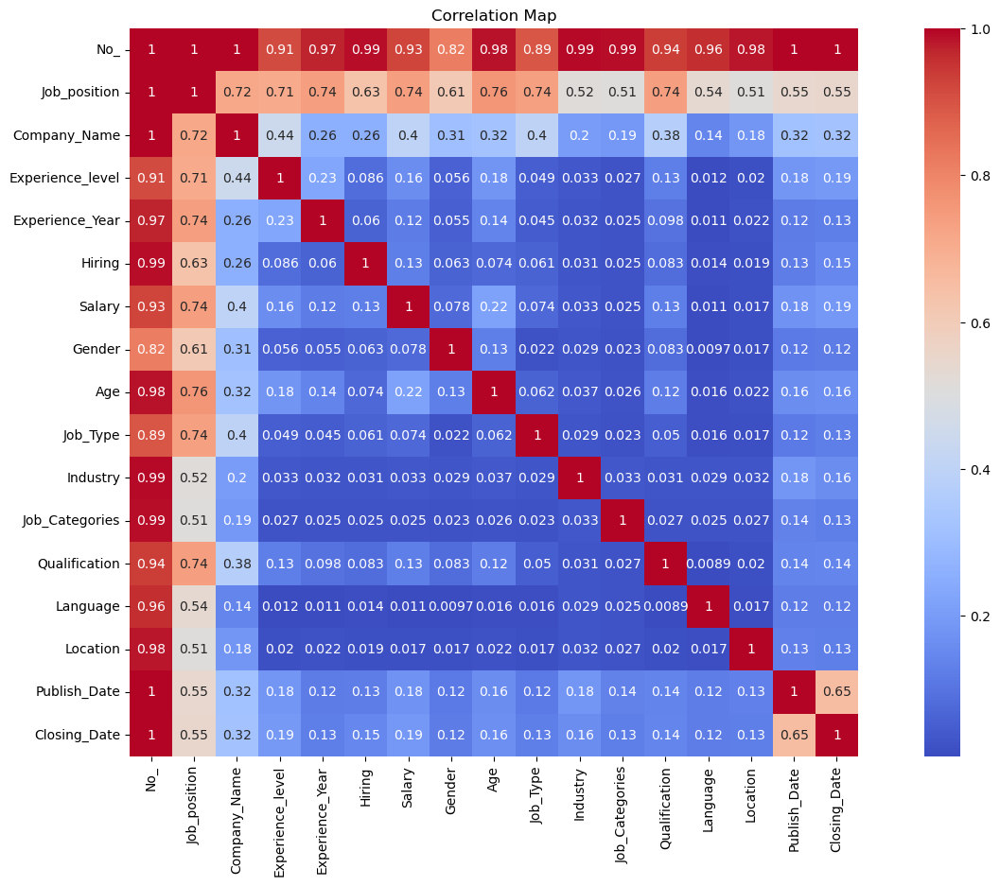